In [ ]:
# Imports
library(Seurat)
library(SingleCellExperiment)
library(SingleR)
library(celldex)    
library(ggplot2)
library(clustree)
library(stringr) 
library(gridExtra)
library(dplyr)
library(GPTCelltype)
library(openai)

# Change setting for visualizing plots within VSCODE
options(repr.plot.width=20, repr.plot.height=12)

# Read myeloid data
myeloid_data <- readRDS("../../../data/R Objects/Myeloid R Objects/all_humans_myeloid_subset.rds")

Warning message:
"package 'Seurat' was built under R version 4.4.2"
Loading required package: SeuratObject

Warning message:
"package 'SeuratObject' was built under R version 4.4.2"
Loading required package: sp

Warning message:
"package 'sp' was built under R version 4.4.2"

Attaching package: 'SeuratObject'


The following objects are masked from 'package:base':

    intersect, t


Loading required package: SummarizedExperiment

Loading required package: MatrixGenerics

Loading required package: matrixStats

Warning message:
"package 'matrixStats' was built under R version 4.4.2"

Attaching package: 'MatrixGenerics'


The following objects are masked from 'package:matrixStats':

    colAlls, colAnyNAs, colAnys, colAvgsPerRowSet, colCollapse,
    colCounts, colCummaxs, colCummins, colCumprods, colCumsums,
    colDiffs, colIQRDiffs, colIQRs, colLogSumExps, colMadDiffs,
    colMads, colMaxs, colMeans2, colMedians, colMins, colOrderStats,
    colProds, colQuantiles, colRanges, colRanks, 

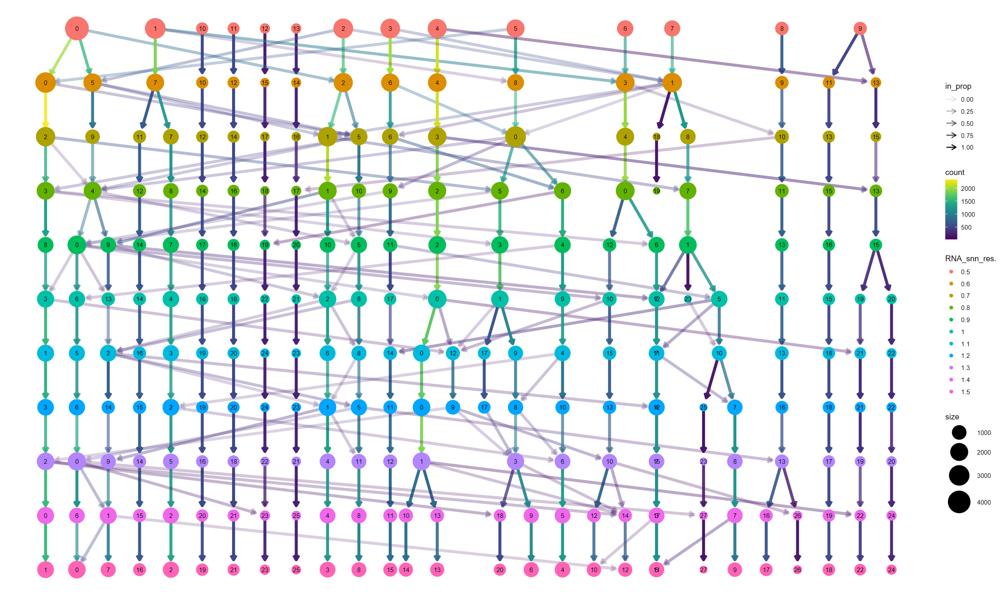

In [2]:
# This cell is meant to analyze the different resolutions and see which one is the best
clustree(myeloid_data, prefix= "RNA_snn_res.", layout = "sugiyama")

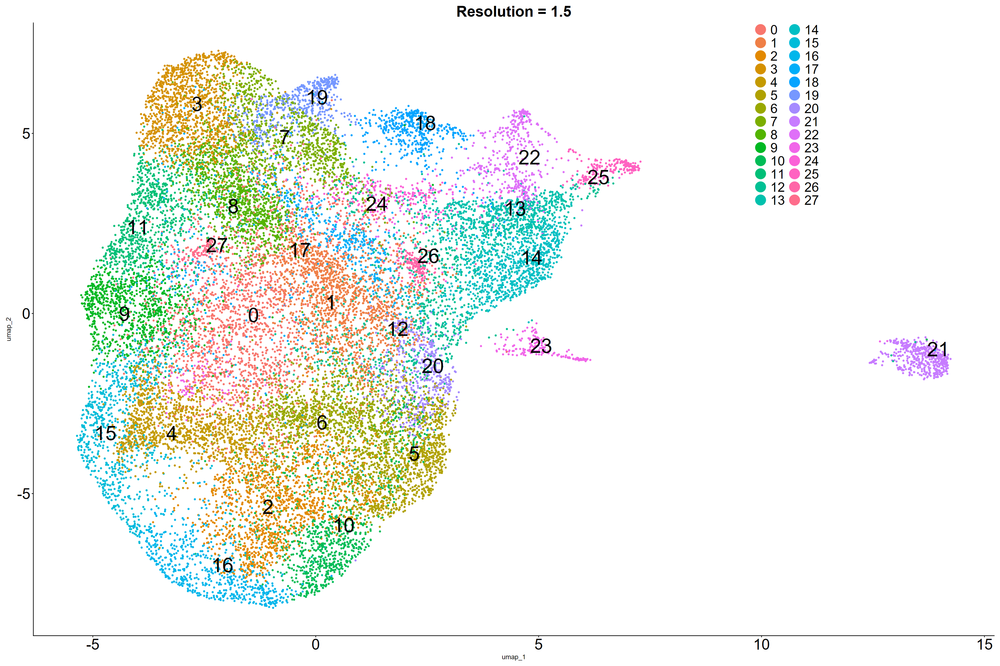

In [13]:
# Change setting for visualizing plots within VSCODE
options(repr.plot.width=30, repr.plot.height=20)

# Get DimPlots of different resolutions
res_1 <- DimPlot(myeloid_data, reduction = "umap", group.by = "RNA_snn_res.1.5", label = T, label.size = 15, repel = T, pt.size=1.1) + 
    theme(plot.title = element_text(size=32),, axis.text.x = element_text(size=32), axis.text.y = element_text(size=32), legend.position = c(0.75, 0.85), legend.text = element_text(size = 28), legend.title = element_text(size = 16, face = "bold")) + 
    guides(color = guide_legend(override.aes = list(size=10), ncol=2)) + ggtitle("Resolution = 1.5")

res_1

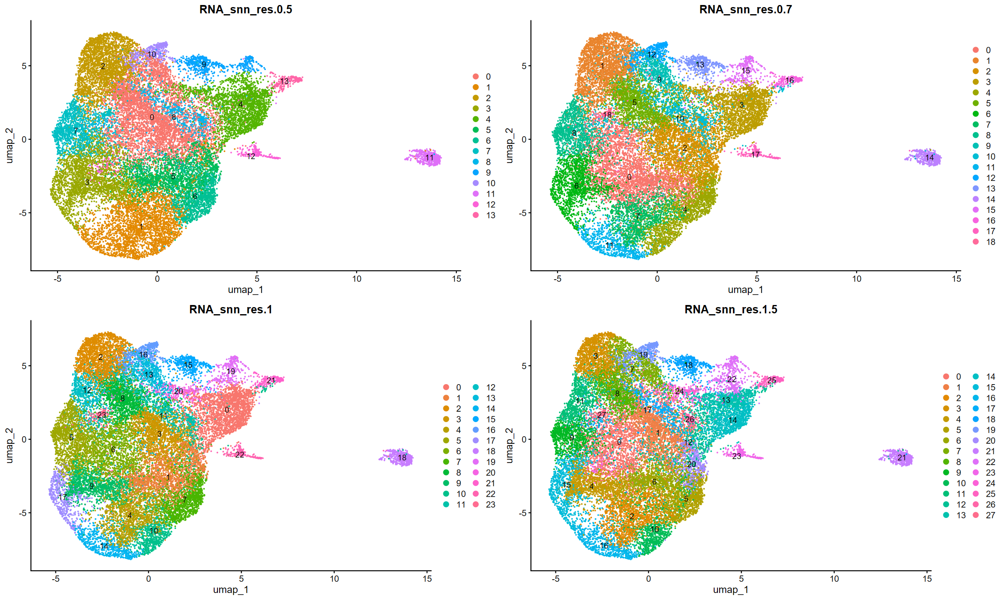

In [ ]:
# Get DimPlots of different resolutions
res_1 <- DimPlot(myeloid_data, reduction = "umap", group.by = "RNA_snn_res.0.5", label = T)
res_2 <- DimPlot(myeloid_data, reduction = "umap", group.by = "RNA_snn_res.0.7", label = T)
res_3 <- DimPlot(myeloid_data, reduction = "umap", group.by = "RNA_snn_res.1", label = T)
res_4 <- DimPlot(myeloid_data, reduction = "umap", group.by = "RNA_snn_res.1.5", label = T)

# Plot
grid.arrange(res_1, res_2, res_3, res_4, ncol=2)

# Assign resolution
myeloid_data$seurat_clusters <- myeloid_data$`RNA_snn_res.1.5`

In [ ]:
# View distribution of idents before assigning resolution
table(Idents(myeloid_data))

# Assign resolution to identity
myeloid_data <- SetIdent(myeloid_data, value = "RNA_snn_res.1.5")

# View distribution of idents after assigning resolution
table(Idents(myeloid_data))


   0    1    2    3    4    5    6    7    8    9   10   11   12   13   14   15 
1890 1624 1452 1325 1293 1192 1140 1117 1079  975  963  924  908  903  887  842 
  16   17   18   19   20   21   22   23   24   25   26   27 
 657  645  570  559  529  509  456  284  269  221  179  149 


   0    1    2    3    4    5    6    7    8    9   10   11   12   13   14   15 
1890 1624 1452 1325 1293 1192 1140 1117 1079  975  963  924  908  903  887  842 
  16   17   18   19   20   21   22   23   24   25   26   27 
 657  645  570  559  529  509  456  284  269  221  179  149 

Calculating cluster 0

Calculating cluster 1

Calculating cluster 2

Calculating cluster 3

Calculating cluster 4

Calculating cluster 5

Calculating cluster 6

Calculating cluster 7

Calculating cluster 8

Calculating cluster 9

Calculating cluster 10

Calculating cluster 11

Calculating cluster 12

Calculating cluster 13

Calculating cluster 14

Calculating cluster 15

Calculating cluster 16

Calculating cluster 17

Calculating cluster 18

Calculating cluster 19

Calculating cluster 20

Calculating cluster 21

Calculating cluster 22

Calculating cluster 23

Calculating cluster 24

Calculating cluster 25

Calculating cluster 26

Calculating cluster 27

Warning message in DoHeatmap(myeloid_data, features = top10$gene, size = 1, angle = 0, :
"The following features were omitted as they were not found in the scale.data slot for the RNA assay: THEMIS, PTPRCAP, AC020914.1, TRIM44, BDP1, PPP1R10, RNMT, YME1L1, MALAT1, PPDPF, UQCRB, MTRNR2L8"
Warning message in viridisLite::viridis(n, alpha,

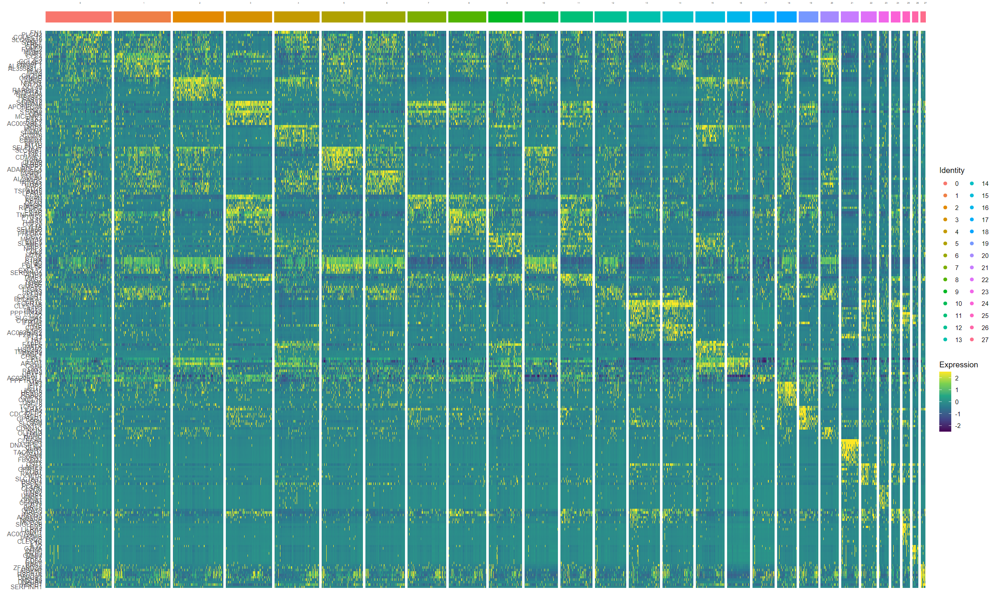

In [ ]:
# Find markers for each cluster
markers <- FindAllMarkers(myeloid_data, only.pos = TRUE, min.pct = 0.25, logfc.threshold = 0.25)
markers %>%
  group_by(cluster) %>%
  dplyr::filter(avg_log2FC > .75) %>%
  slice_head(n = 10) %>%
  ungroup() -> top10

# Heatmap
top10 <- markers %>% group_by(cluster) %>% top_n(10, avg_log2FC)
DoHeatmap(myeloid_data, features = top10$gene, size=1, angle=0, raster=FALSE) &
  scale_fill_viridis_c(option="blue",na.value = "white")

In [ ]:
# Filter markers
markers %>%  group_by(cluster) %>% filter(as.numeric(as.character(cluster)) > 23) %>% filter(p_val_adj < 0.05) %>% slice_max(order_by = avg_log2FC, n = 10) %>% arrange(cluster, desc(pct.1)) 

p_val,avg_log2FC,pct.1,pct.2,p_val_adj,cluster,gene
<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<fct>,<chr>
8.753961e-97,2.042110,0.851,0.305,4.347480e-92,24,AREG
1.519298e-112,2.019040,0.822,0.254,7.545290e-108,24,CLEC10A
2.179174e-66,2.080479,0.703,0.282,1.082243e-61,24,INSIG1
1.426482e-113,2.438533,0.647,0.155,7.084337e-109,24,GPAT3
7.459953e-147,2.001065,0.617,0.106,3.704837e-142,24,CD1C
1.675434e-56,2.045130,0.428,0.115,8.320710e-52,24,IL1R2
4.313544e-64,2.250675,0.349,0.074,2.142235e-59,24,ADAM19
5.786083e-62,2.471505,0.335,0.071,2.873542e-57,24,DUSP4
1.164898e-44,1.960486,0.305,0.075,5.785232e-40,24,NRARP


In [ ]:
# Marker genes 
myeloid_data <- SetIdent(myeloid_data, value = "seurat_clusters")
#features_macrophage <- c("Cd14", "Cd68", "Fcgr3", "Fcgr1", "Ccr5", "Cd163", "Fut4", "Itgax", "Itgam", "Cd80", "Cd86")
#features_monocytes <- c("C1qc", "C1qb", "C1qa", "Mertk", "Pga5", "Pcdh12", "Aldh1a1", "C2", "Avpr2", "Cxcr3", "Cttnbp2") # https://www.proteinatlas.org/humanproteome/single+cell/immune+cell/monocytes#classical_monocytes
#features_monocytes <- c("Itgam", "Csf1r", "Ly6c1", "Sell", "Itgax", "Ccr1", "Ccr5")
features_monocytes <- c("Irf7", "Mx1", "Il1rn", "Ifit1", "Ifit3", "Cxcl10", "Csf1r", "Mnda", "Clec4a2", "Ly6c2", "Ly6c1", "Cd44")
features_macrophage <- c("Lyz2", "Csf1r", "Cd68", "Aif1", "Cybb", "Cd14", "Dab2", "Ccl6", "Clec4a2", "Ms4a7", "H2-Ab1", "H2-Eb1", "TREM1", "PLIN2", "SPINK1")
features_dcs <- c("Ctss", "H2-Ab1", "H2-Eb1", "Batf3", "Xcr1", "Irf8", "Aif1", "Cd83", "H2afy", "Flt3", "Napsa", "H2-Dma")
features_monocytes <- c("Csf1r", "Itgam", "Cx3cr1", "Ly6c1", "Ly6c2", "Ccr2", "Sell", "Spn", "Irf7", "Mx1", "Il1rn")
features_macrophage <- c("FOLR2", "TREM2", "FABP5", "TREM1", "PLIN2")

# Convert all features to uppercase
features_monocytes <- toupper(features_monocytes)
features_macrophage <- toupper(features_macrophage)
features_dcs <- toupper(features_dcs)

# Add a module score to the Seurat object

myeloid_data <- AddModuleScore(myeloid_data, features = list(features_macrophage), name = "FeatureGeneScore_macrophages")
myeloid_data <- AddModuleScore(myeloid_data, features = list(features_monocytes), name = "FeatureGeneScore_monocytes")
myeloid_data <- AddModuleScore(myeloid_data, features = list(features_dcs), name = "FeatureGeneScore_dcs")

# Vln plots
macrophage_vln <- VlnPlot(myeloid_data, features = "FeatureGeneScore_macrophages1", group.by = "seurat_clusters") + 
  ggtitle("FeatureGeneScores for macrophage markers")
monocyte_vln <- VlnPlot(myeloid_data, features = "FeatureGeneScore_monocytes1", group.by = "seurat_clusters") + 
  ggtitle("FeatureGeneScores for monocyte markers")
dc_vln <- VlnPlot(myeloid_data, features = "FeatureGeneScore_dcs1", group.by = "seurat_clusters") + 
  ggtitle("FeatureGeneScores for dendritic cell markers")

# Visualizing DotPlots to view marker genes
macrophage_dot <- DotPlot(myeloid_data, features = features_macrophage) + 
  ggtitle("Markers for Macrophages") + RotatedAxis()

monocyte_dot <- DotPlot(myeloid_data, features = features_monocytes) + 
  ggtitle("Markers for monocytes") + RotatedAxis()
dc_dot <- DotPlot(myeloid_data, features = features_dcs) + 
  ggtitle("Markers for dendritic cells") + RotatedAxis()

all_dot <- DotPlot(myeloid_data, features = features_macrophage) + 
  ggtitle("Myeloid cell markers") + RotatedAxis()

Warning message:
"The following features are not present in the object: LY6C1, LY6C2, not searching for symbol synonyms"
Warning message:
"The following features are not present in the object: H2-AB1, H2-EB1, H2-DMA, not searching for symbol synonyms"
Warning message:
"The following requested variables were not found: LY6C1, LY6C2"
Warning message:
"The following requested variables were not found: H2-AB1, H2-EB1, H2-DMA"


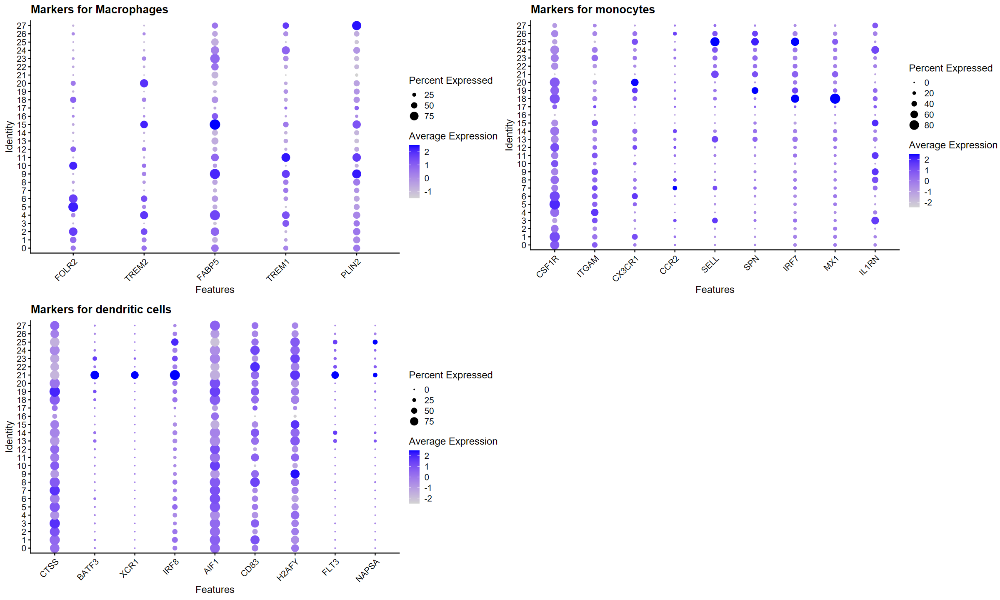

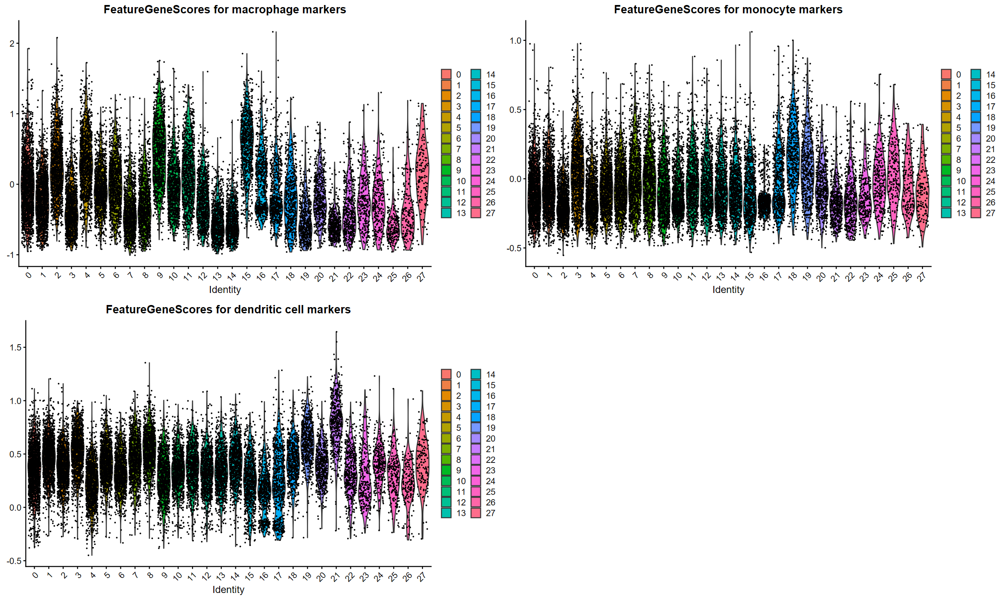

In [10]:
# Plot
grid.arrange(macrophage_dot, monocyte_dot, dc_dot, ncol = 2)
grid.arrange(macrophage_vln, monocyte_vln, dc_vln, ncol=2)

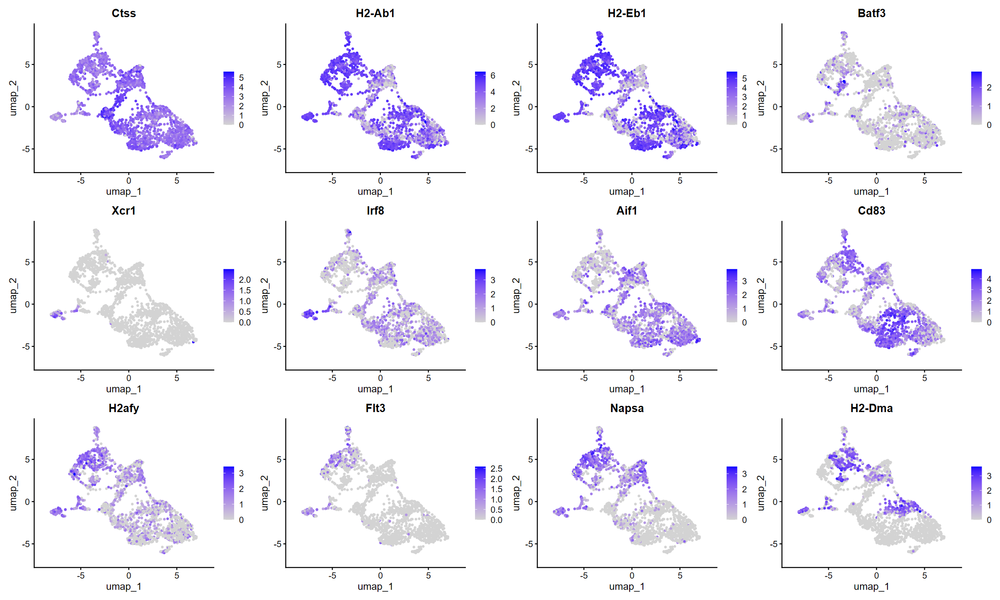

In [ ]:
# Featureplot of DC markers
FeaturePlot(myeloid_data, features = features_dcs)

In [ ]:
# This cell block is needed to find the different markers between several clusters of which we dont know the identity
myeloid_data <- SetIdent(myeloid_data, value = "seurat_clusters")
markers <- FindMarkers(myeloid_data, ident.1 = "10", ident.2 = "0",  only.pos = TRUE, min.pct = 0.25, logfc.threshold = 0.25)
markers %>%
  dplyr::filter(avg_log2FC > .75) %>%
  slice_head(n = 5) %>%
  ungroup() -> top10

# Markers
markers %>% filter(p_val_adj < 0.05) %>% slice_max(order_by = avg_log2FC, n = 8) %>% arrange(desc(pct.1))

,p_val,avg_log2FC,pct.1,pct.2,p_val_adj
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
Ear2,1.536861e-90,8.334979,0.957,0.007,4.712323e-86
Upb1,5.822098e-60,9.389566,0.609,0.000,1.785172e-55
Rpl13-Ps3,1.689608e-53,9.106194,0.565,0.002,5.180678e-49
H2-Dmb2,2.194422e-53,9.981964,0.543,0.000,6.728537e-49
Ryr1,3.274099e-51,8.704667,0.522,0.000,1.003904e-46
Hr,6.848377e-47,8.342483,0.478,0.000,2.099849e-42
4930523c07rik,4.811014e-32,7.843038,0.326,0.000,1.475153e-27
Slc27a3,7.066749e-28,8.172339,0.283,0.000,2.166807e-23


In [ ]:
# OpenAI key
Sys.setenv(OPENAI_API_KEY = 'use your own key')

# Cell type annotation with GPT, for interest
res <- gptcelltype(
    markers, 
    tissuename = 'Atherosclerotic human carotid plaques. Only macrophages, monocytes or dendritic cells.',
    model = 'gpt-4o')

# Assign cell type annotation back to Seurat object
myeloid_data@meta.data$celltype <- as.factor(res[as.character(Idents(myeloid_data))])

Warning message:
"package 'openai' was built under R version 4.4.2"


[1] "Note: OpenAI API key found: returning the cell type annotations."
[1] "Note: It is always recommended to check the results returned by GPT-4 in case of\n AI hallucination, before going to down-stream analysis."


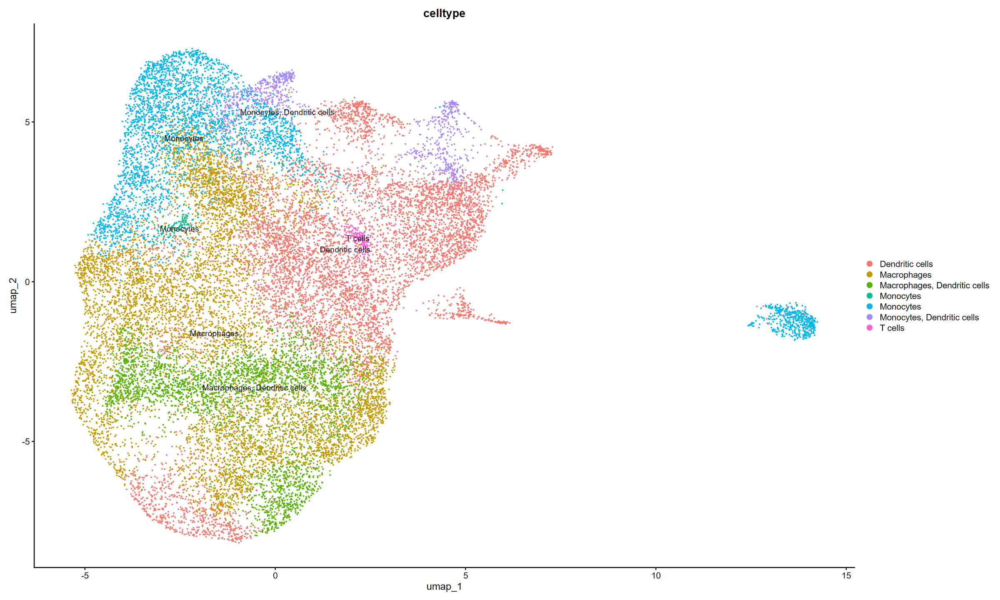

In [ ]:
# Visualize GPT cell type annotation on UMAP
DimPlot(myeloid_data, reduction="umap", group.by='celltype', label=TRUE)

In [95]:
# FindMarkers between cluster 2 and c(Inflammation, Resident-like & TREM2 FOAMY)
known_clusters = list("5", "19", "21")
# Reset Idents
myeloid_data <- SetIdent(myeloid_data, value = "seurat_clusters")

find_markers <- lapply(known_clusters, function(known) {
  FindMarkers(myeloid_data, ident.1 = "6", ident.2 = known,  only.pos = TRUE, min.pct = 0.25, logfc.threshold = 0.25) %>%
    filter(p_val_adj < 0.05) %>%
    slice_max(order_by = avg_log2FC, n = 10) %>%
    arrange(desc(pct.1))
})

names(find_markers) <- c("Macrophages", "Monocytes", "Dendritic_cells")
find_markers$Macrophages
find_markers$Monocytes
find_markers$Dendritic_cells

,p_val,avg_log2FC,pct.1,pct.2,p_val_adj
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
S100A4,7.825035e-187,2.277980,0.946,0.672,3.886147e-182
S100A6,4.203700e-173,2.378944,0.924,0.578,2.087683e-168
ALOX5AP,2.665287e-195,2.892855,0.820,0.258,1.323661e-190
FCGBP,2.685168e-146,3.133764,0.680,0.178,1.333535e-141
HTRA1,1.423912e-90,2.289533,0.573,0.181,7.071574e-86
SPP1,8.882966e-58,2.754803,0.548,0.272,4.411547e-53
HPGDS,2.968012e-64,2.319456,0.390,0.091,1.474004e-59
CLDN1,8.003774e-96,4.193741,0.385,0.038,3.974914e-91
CLEC5A,1.918291e-99,4.835990,0.362,0.020,9.526808e-95


,p_val,avg_log2FC,pct.1,pct.2,p_val_adj
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
PLTP,4.892242e-180,6.165554,0.837,0.036,2.429634e-175
SELENOP,2.328909e-164,6.636468,0.787,0.025,1.156606e-159
FCGBP,6.051278e-133,6.914139,0.680,0.011,3.005246e-128
IGSF21,1.619683e-103,6.117088,0.575,0.011,8.043832e-99
EMP2,1.166568e-67,6.360340,0.416,0.005,5.793525e-63
HPGDS,1.875052e-62,6.560992,0.390,0.005,9.312070e-58
CLDN1,1.776522e-61,7.078121,0.385,0.005,8.822742e-57
TSPAN15,1.347671e-53,6.365066,0.346,0.005,6.692941e-49
APOE,1.637212e-45,6.506890,0.340,0.030,8.130885e-41


,p_val,avg_log2FC,pct.1,pct.2,p_val_adj
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
CD14,2.422466e-220,6.353888,0.973,0.077,1.203070e-215
FCGR1A,1.214183e-169,6.832735,0.831,0.018,6.029996e-165
FCGBP,3.028584e-121,6.323456,0.680,0.016,1.504086e-116
CCL2,1.542543e-84,7.550648,0.539,0.028,7.660734e-80
TREM2,5.754749e-83,6.613781,0.520,0.012,2.857981e-78
FCGR1B,1.696334e-73,6.569014,0.475,0.012,8.424501e-69
EMP2,6.087164e-62,6.336933,0.416,0.008,3.023068e-57
HPGDS,2.701752e-57,6.925090,0.390,0.008,1.341771e-52
PMP22,2.347700e-54,6.444607,0.378,0.010,1.165938e-49


In [ ]:
# Assign annotations of found DGE analysis
myeloid_data <- SetIdent(myeloid_data, value = "seurat_clusters")
myeloid_data <- RenameIdents(myeloid_data,
                                   '0' = 'Macrophages',
                                   '1' = 'Macrophages',
                                   '2' = 'Macrophages', 
                                   '3' = 'Monocytes',
                                   '4' = 'Macrophages',
                                   '5' = 'Macrophages',
                                   '6' = 'Macrophages',
                                   '7' = 'Monocytes',
                                   '8' = 'Macrophages', 
                                   '9' = 'Macrophages',
                                   '10' = 'Macrophages',
                                   '11' = 'Macrophages',
                                   '12' = 'Macrophages',
                                   '13' = 'Dendritic cells', 
                                   '14' = 'Dendritic cells',
                                   '15' = 'Macrophages',
                                   '16' = 'Macrophages', 
                                   '17' = 'Monocytes', 
                                   '18' = 'Macrophages',
                                   '19' = 'Monocytes',
                                   '20' = 'Macrophages',
                                   '21' = 'Dendritic cells',
                                   '22' = 'Dendritic cells', 
                                   '23' = 'Macrophages',
                                   '24' = 'Dendritic cells',
                                   '25' = 'Dendritic cells',
                                   '26' = 'NK cluster',
                                   '27' = 'Macrophages')


# Assing value of found annotation to celltype2 slot
myeloid_data$celltype2 <- Idents(myeloid_data)

# Proportion tables
annotations_per_origin <- table(Idents(myeloid_data), myeloid_data$orig.ident)
annotations_per_origin_prop <- prop.table(table(Idents(myeloid_data), myeloid_data$orig.ident), margin = 2) * 100

# Subtype plots after annotation
subtype_annotated_plot <- DimPlot(myeloid_data, reduction = "umap", group.by="celltype2", label = TRUE)
subtype_origin_plot <- DimPlot(myeloid_data, reduction = "umap", group.by = "orig.ident", label = TRUE)


# Combine tables side by side
combined_df <- cbind(annotations_per_origin, annotations_per_origin_prop)

In [ ]:
# FInd Markers post-annotation for validation
markers <- FindAllMarkers(myeloid_data, only.pos = TRUE, min.pct = 0.25, logfc.threshold = 0.25)
markers %>%  group_by(cluster) %>% filter(p_val_adj < 0.05) %>% slice_max(order_by = avg_log2FC, n = 10) %>% arrange(cluster, desc(pct.1)) 

Calculating cluster Macrophages

Calculating cluster Monocytes

Calculating cluster Dendritic cells

Calculating cluster NK cluster



p_val,avg_log2FC,pct.1,pct.2,p_val_adj,cluster,gene
<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<fct>,<chr>
0.000000e+00,3.738965,0.683,0.123,0.000000e+00,Macrophages,C1QC
0.000000e+00,3.648165,0.665,0.154,0.000000e+00,Macrophages,C1QB
0.000000e+00,4.064578,0.611,0.094,0.000000e+00,Macrophages,PLTP
0.000000e+00,3.894627,0.532,0.084,0.000000e+00,Macrophages,RNASE1
0.000000e+00,4.186321,0.493,0.051,0.000000e+00,Macrophages,SELENOP
0.000000e+00,4.743175,0.489,0.133,0.000000e+00,Macrophages,SPP1
0.000000e+00,4.595113,0.473,0.073,0.000000e+00,Macrophages,APOE
0.000000e+00,4.227934,0.467,0.045,0.000000e+00,Macrophages,GPNMB
0.000000e+00,4.826309,0.461,0.094,0.000000e+00,Macrophages,APOC1


,"Bashore et al. (2024), 13","Bashore et al. (2024), P14","Bashore et al. (2024), P15","Bashore et al. (2024), P16","Bashore et al. (2024), P17","Bashore et al. (2024), P18","Bashore et al. (2024), P19","Bashore et al. (2024), P20","Bashore et al. (2024), P21","Bashore et al. (2024), P4",⋯,"Fernandez et al. (2019), P3","Fernandez et al. (2019), P4","Fernandez et al. (2019), P5","Fernandez et al. (2019), P6","Horstmann et al. (2023), P3","Horstmann et al. (2023), P4","Horstmann et al. (2023), P5","Horstmann et al. (2023), P6","Horstmann et al. (2023), P7","Horstmann et al. (2023), P8"
Macrophages,275,824,571,1260,896,359,885,263,681,212,⋯,71.428571,68.5863874,74.074074,64.285714,65.07937,59.19732,50.629371,55.6894244,50.000000,45.238095
Monocytes,24,93,171,62,68,28,106,32,125,5,⋯,7.936508,9.9476440,8.641975,16.071429,12.69841,17.72575,25.827506,17.1352075,23.711340,22.916667
Dendritic cells,28,55,36,63,63,24,51,34,67,18,⋯,20.634921,20.9424084,16.049383,17.857143,22.22222,23.07692,22.144522,26.9076305,23.453608,25.297619
NK cluster,3,0,3,1,3,2,4,0,21,0,⋯,0.000000,0.5235602,1.234568,1.785714,0.00000,0.00000,1.398601,0.2677376,2.835052,6.547619


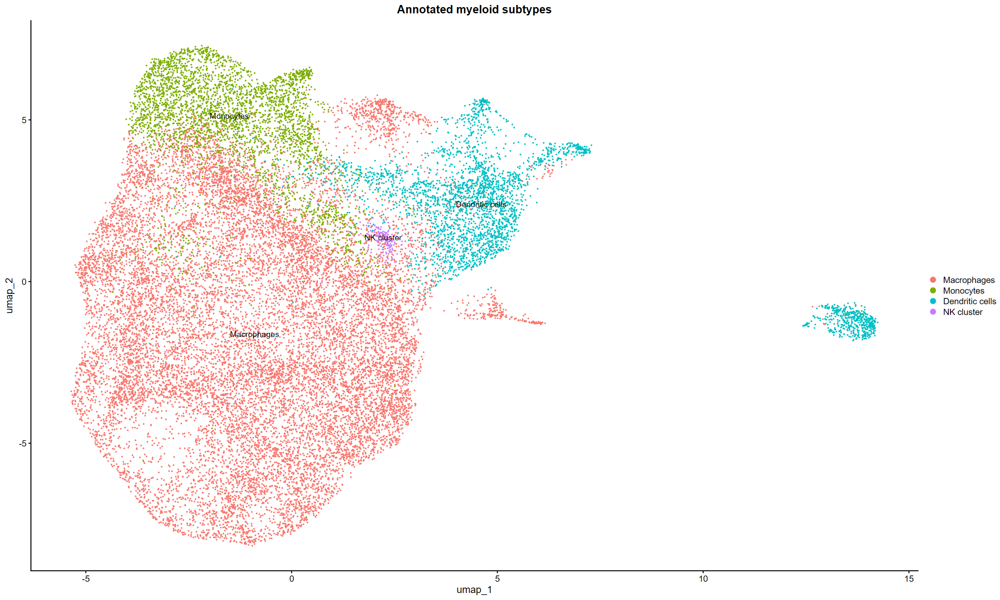

In [ ]:
# Plot table
combined_df

# Plotting annotations and titles
grid.arrange(
    subtype_annotated_plot + ggtitle("Annotated myeloid subtypes")
    subtype_origin_plot + ggtitle("DimPlot by origin")
    ncol=1
)

In [22]:
# Export result
saveRDS(myeloid_data, "all_humans_myeloid_results.rds")

In [ ]:
# Subset macrophages & create a new seurat object of counts
macrophages <- subset(myeloid_data, subset = celltype2 == "Macrophages")
macrophages_obj <- CreateSeuratObject(counts = macrophages@assays$RNA$counts)

In [ ]:
# assign same orig.ident
macrophages_obj$orig.ident <- macrophages$orig.ident

In [ ]:
# View distribution of cells
table(macrophages_obj$orig.ident)


  Bashore et al. (2024), 13  Bashore et al. (2024), P14 
                        275                         824 
 Bashore et al. (2024), P15  Bashore et al. (2024), P16 
                        571                        1260 
 Bashore et al. (2024), P17  Bashore et al. (2024), P18 
                        896                         359 
 Bashore et al. (2024), P19  Bashore et al. (2024), P20 
                        885                         263 
 Bashore et al. (2024), P21   Bashore et al. (2024), P4 
                        681                         212 
  Bashore et al. (2024), P6   Bashore et al. (2024), P9 
                       1321                        1584 
  Depuydt et al. (2020), P3   Depuydt et al. (2020), P5 
                         79                         322 
  Depuydt et al. (2020), P7       Dib et al. (2022), P1 
                        490                         305 
      Dib et al. (2022), P2       Dib et al. (2022), P3 
                        836   

In [ ]:
# Define negation
`%notin%` <- Negate(`%in%`)

# Remove samples where <50 macrophage cells
macrophages_obj <- subset(macrophages_obj, subset = (orig.ident %notin% c(
    "Fernandez et al. (2019), P3",
    "Fernandez et al. (2019), P6",
    "Horstmann et al. (2023), P3"
    )))

[1] "Fernandez et al. (2019), P2" "Fernandez et al. (2019), P4"
 [3] "Fernandez et al. (2019), P5" "Horstmann et al. (2023), P4"
 [5] "Horstmann et al. (2023), P5" "Horstmann et al. (2023), P6"
 [7] "Horstmann et al. (2023), P7" "Horstmann et al. (2023), P8"
 [9] "Depuydt et al. (2020), P3"   "Depuydt et al. (2020), P5"  
[11] "Depuydt et al. (2020), P7"   "Bashore et al. (2024), P4"  
[13] "Bashore et al. (2024), P6"   "Bashore et al. (2024), P9"  
[15] "Bashore et al. (2024), 13"   "Bashore et al. (2024), P14" 
[17] "Bashore et al. (2024), P15"  "Bashore et al. (2024), P16" 
[19] "Bashore et al. (2024), P17"  "Bashore et al. (2024), P18" 
[21] "Bashore et al. (2024), P19"  "Bashore et al. (2024), P20" 
[23] "Bashore et al. (2024), P21"  "Dib et al. (2022), P1"      
[25] "Dib et al. (2022), P2"       "Dib et al. (2022), P3"      
[27] "Dib et al. (2022), P5"       "Dib et al. (2022), P6"      
[29] "Dib et al. (2022), P7"

In [ ]:
# Preprocessing function which performs a basic workflow for scRNA seq analysis
pre_process <- function(data, nFeatures_RNA = 200, nCounts_RNA = 3, percents.mt = 5, pattern = "MT", resolutions = seq(0.5, 1.5, by = 0.1), k.weights = 100) {
    # Split
    data[["RNA"]] <- split(data[["RNA"]], f = data$orig.ident)

    # Get percentage mt                     
    data[["percent.mt"]] <- PercentageFeatureSet(data, pattern = sprintf("^%s-", pattern))

    # Subsets
    data <- subset(x = data, subset = nFeature_RNA >= nFeatures_RNA & nCount_RNA >= nCounts_RNA & percent.mt <= percents.mt)

    # Normalization
    data <- NormalizeData(data, normalization.method = "LogNormalize", scale.factor = 10000)
    
    # Find Variable features
    data <- FindVariableFeatures(data, selection.method = "vst", nfeatures = 2000)
    
    # Scale Data
    data <- ScaleData(data, vars.to.regress = c("percent.mt", "nFeature_RNA"))
    
    # Run PCA
    data <- RunPCA(data, npcs = 100, verbose=FALSE)

    # Get significant PCAs through Jackstrawplot
    data <- JackStraw(data, num.replicate = 100)
    data <- ScoreJackStraw(data, dims = 1:20)

    # Check the amount of significant pcs
    significant_pcs <- length(which(data@reductions$pca@jackstraw$overall.p.values < 0.05))

    # Run UMAP
    data <- RunUMAP(data, reduction = "pca", dims = 1:significant_pcs, reduction.name="umap_before_integration", verbose=FALSE)

    # Integrate
    data <- IntegrateLayers(
        object = data, 
        method = CCAIntegration, 
        orig.reduction = "pca", 
        new.reduction = "integrated.cca", 
        k.weight = 
        k.weights,
        verbose = FALSE)

    data[["RNA"]] <- JoinLayers(data[["RNA"]])

    # Post integration processing
    data <- RunPCA(data, npcs = 100, verbose=FALSE)

    # Get significant PCAs through Jackstrawplot
    data <- JackStraw(data, num.replicate = 100)
    data <- ScoreJackStraw(data, dims = 1:20)

    # Check the amount of significant pcs
    significant_pcs <- length(which(data@reductions$pca@jackstraw$overall.p.values < 0.05))

    # Clustering
    data <- FindNeighbors(data, reduction = "integrated.cca", dims = 1:significant_pcs)
    data <- FindClusters(data, resolution = resolutions)
    data <- RunUMAP(data, dims = 1:significant_pcs, reduction = "integrated.cca", verbose=FALSE)

    return(data)
}

# Process the macrophages again
macrophages_processed <- pre_process(macrophages_obj, k.weights = 55, percents.mt = 15)

Normalizing layer: counts.Fernandez_et_al._2019,_P2

Normalizing layer: counts.Fernandez_et_al._2019,_P4

Normalizing layer: counts.Fernandez_et_al._2019,_P5

Normalizing layer: counts.Horstmann_et_al._2023,_P4

Normalizing layer: counts.Horstmann_et_al._2023,_P5

Normalizing layer: counts.Horstmann_et_al._2023,_P6

Normalizing layer: counts.Horstmann_et_al._2023,_P7

Normalizing layer: counts.Horstmann_et_al._2023,_P8

Normalizing layer: counts.Depuydt_et_al._2020,_P3

Normalizing layer: counts.Depuydt_et_al._2020,_P5

Normalizing layer: counts.Depuydt_et_al._2020,_P7

Normalizing layer: counts.Bashore_et_al._2024,_P4

Normalizing layer: counts.Bashore_et_al._2024,_P6

Normalizing layer: counts.Bashore_et_al._2024,_P9

Normalizing layer: counts.Bashore_et_al._2024,_13

Normalizing layer: counts.Bashore_et_al._2024,_P14

Normalizing layer: counts.Bashore_et_al._2024,_P15

Normalizing layer: counts.Bashore_et_al._2024,_P16

Normalizing layer: counts.Bashore_et_al._2024,_P17

Normalizing

Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 16349
Number of edges: 648379

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.8445
Number of communities: 11
Elapsed time: 3 seconds
Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 16349
Number of edges: 648379

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.8350
Number of communities: 12
Elapsed time: 3 seconds
Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 16349
Number of edges: 648379

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.8241
Number of communities: 12
Elapsed time: 3 seconds
Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 16349
Number of edges: 648379

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.8151
Number of communities: 14
Elapsed time: 2 seconds
Modularity O

In [ ]:
# Save the processed macrophage R object
saveRDS(macrophages_processed, "all_humans_macrophage_subset_v1.rds")